# Cloud Inpainting on SEN3 Data
This notebook is a quick test to load, mask with clouds and then try and recover the data hidden by clouds using an inpainting DL model

In [1]:
!pip install tensorflow
!pip install keras==3.3.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 48.6 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1


In [2]:
from google.colab import drive
drive.mount('/content/drive')




Mounted at /content/drive


In [4]:
!mkdir cloud_inpainting
!cp -R "/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/network" "/content/cloud_inpainting"
!cp -R "/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/data" "/content/cloud_inpainting"

In [1]:
import sys
sys.path.insert(0,"/content/cloud_inpainting")

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from network.model import SAGAN
from network.callbacks import LearningRateSchedulerCallback, OutputImageToTensorBoard, ShiftGPCenterAfterX
import keras
import os


%load_ext autoreload
# Load the TensorBoard notebook extension
%load_ext tensorboard
%autoreload 2


In [2]:
gpus = tf.config.list_logical_devices('GPU')
strategy = tf.distribute.MirroredStrategy(gpus)


## Extracting the bands from the Xarrays

The goal here is to convert the data into a more tensorflow friendly data format

In [ ]:
dsnp = np.moveaxis(np.load("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/Ground_truth3.npy"),3,0)

In [ ]:
!rm -rf ./cloud_inpainting/data/cloudless/*

In [ ]:
for i in range(2000):
  ds = dsnp[i,:,:,:]
  for j in range(11):
    ds[:,:,j] = (ds[:,:,j] - np.mean(ds[:,:,j]))/(2*np.std(ds[:,:,j]))
  np.save("./cloud_inpainting/data/cloudless/cloudless_"+str(i)+".npy", ds)

In [3]:
#Split into training and test set
BATCH_SIZE = 10
SHUFFLE_BUFFER_SIZE = 100
#path to cloudless npy arrays (1000 arrays of 256x256x11 that are the ground truth and will be masked with cloud files)
PATH_TO_CLOUD_MASKS = "./cloud_inpainting/data/masks"
PATH_TO_CLOUD_CLOUDLESS = "./cloud_inpainting/data/cloudless"

npy_files_masks = [f for f in os.listdir(PATH_TO_CLOUD_MASKS) if f.endswith('.npy')]
npy_files_cloudless = [f for f in os.listdir(PATH_TO_CLOUD_CLOUDLESS) if f.endswith('.npy')]




class keras_augmenter(keras.Model):
    def __init__(self):
      super(keras_augmenter, self).__init__()
      self.augmenter = keras.Sequential([
                        keras.layers.RandomFlip(seed=42),
                        keras.layers.RandomRotation(0.2, seed=42),
                        ])
    def call(self, x):
      return self.augmenter(x)

augmenter = keras_augmenter()

def mask_generator(files, PATH):
    for file in files:
        yield np.expand_dims(np.load(os.path.join(PATH, file)),axis=-1)

#Dataset is already normalized now to save time
def normalize_ds(ds):
    return (ds/0.5 - 1)

def npy_generator(files, PATH):
    for file in files:
        yield np.load(os.path.join(PATH, file))



train_cloudless_ds = tf.data.Dataset.from_generator(npy_generator, args=[npy_files_cloudless[:1800], PATH_TO_CLOUD_CLOUDLESS], output_shapes=(256,256,11), output_types=tf.float32).shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
train_mask_ds = tf.data.Dataset.from_generator(mask_generator, args=[npy_files_masks[:800], PATH_TO_CLOUD_MASKS],output_shapes=(256,256,1), output_types=tf.float32).repeat().shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
train_pre_ds = tf.data.Dataset.zip((train_mask_ds.map(lambda x: augmenter(x)), train_cloudless_ds))

test_cloudless_ds = tf.data.Dataset.from_generator(npy_generator, args=[npy_files_cloudless[1800:], PATH_TO_CLOUD_CLOUDLESS], output_shapes=(256,256,11), output_types=tf.float32).shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
test_mask_ds = tf.data.Dataset.from_generator(mask_generator, args=[npy_files_masks[800:], PATH_TO_CLOUD_MASKS],output_shapes=(256,256,1), output_types=tf.float32).repeat().batch(BATCH_SIZE, drop_remainder=True)
test_pre_ds = tf.data.Dataset.zip((test_mask_ds.map(lambda z: augmenter(z)), test_cloudless_ds))

del train_cloudless_ds, train_mask_ds, test_cloudless_ds, test_mask_ds

In [4]:

#del dsnp
#del dsnp_c
#train_ds = train_ds.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
#test_ds = test_ds.batch(BATCH_SIZE)

train_ds = train_pre_ds.prefetch(tf.data.AUTOTUNE).cache().repeat().shuffle(SHUFFLE_BUFFER_SIZE)
test_ds = test_pre_ds

del test_pre_ds, train_pre_ds, npy_files_cloudless, npy_files_masks

## Model Definition

In [5]:
model = SAGAN(32)
gen_opti = keras.optimizers.Adam(learning_rate=0.0002)
disc_opti = keras.optimizers.Adam(learning_rate=0.00001)
model.compile(strategy=strategy, gen_optimizer=gen_opti, dis_optimizer=disc_opti)
model.optimizer.learning_rate = 0.0004
print(model.summary())


/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:361: UserWarning: `build()` was called on layer 'gated_conv2d_14', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:361: UserWarning: `build()` was called on layer 'gated_conv2d_30', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `bui

Model: "sagan"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gen_model (GenModel)                 │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ multi_discriminator                  │ ?                           │     0 (unbuilt) │
│ (MultiDiscriminator)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg_from_torch (VGG_fromTorch)       │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_51 (Functional)           │ ?                           │         557,888 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_4 (UpSampling2D)       │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,880,382 (79.65 MB)

 Trainable params: 6,142,586 (23.43 MB)

 Non-trainable params: 14,737,796 (56.22 MB)

None


In [ ]:
!rm -rf ./cloud_inpainting/logs/train
!rm -rf ./cloud_inpainting/logs/validation
!rm -rf ./cloud_inpainting/logs/images

In [6]:
%tensorboard --logdir ./cloud_inpainting/logs

Output hidden; open in https://colab.research.google.com to view.

Still a problem of divergence, Wasserstein loss is not good at fitting the data. Using the original loss for the discriminator and generator might be better : issue is that the generator loss when paired with the other losses is very small so does not have much influence in training I fear. An adaptative weight might be useful to counter this issue

In [ ]:
!rm -rf ./cloud_inpainting/logs/plugins

In [ ]:
model.fit(train_ds, epochs=15000, steps_per_epoch=180, initial_epoch=0,  validation_data=test_ds, callbacks=[ShiftGPCenterAfterX(sagan=model, target = 0, trigger1=None, trigger2=50), OutputImageToTensorBoard(sagan=model, epochs=5, test_ds=test_ds, log_dir="./cloud_inpainting/logs/images"),keras.callbacks.ModelCheckpoint(filepath='./cloud_inpainting/SAGAN.keras', save_best_only=True, save_freq="epoch"), tf.keras.callbacks.TensorBoard(log_dir='./cloud_inpainting/logs'),  keras.callbacks.CSVLogger('./cloud_inpainting/SAGAN.csv'), keras.callbacks.TerminateOnNaN()])
#LearningRateSchedulerCallback(model, 100, 0.8, 0.001),

Epoch 1/15000
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 737ms/step - loss: 0.6758

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:361: UserWarning: `build()` was called on layer 'sagan', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


180/180 ━━━━━━━━━━━━━━━━━━━━ 453s 1s/step - loss: 0.6751 - val_dis_loss: 2.0006 - val_gen_loss: -3.1610e-05 - val_loss: 0.4135 - val_perceptual_loss: 0.7888 - val_reconstruct_loss: 0.4118 - val_ssim: 0.9457 - val_style_loss: 0.9239
Epoch 2/15000
180/180 ━━━━━━━━━━━━━━━━━━━━ 139s 773ms/step - loss: 0.4087 - val_dis_loss: 1.9983 - val_gen_loss: -1.0370e-08 - val_loss: 0.3939 - val_perceptual_loss: 0.7469 - val_reconstruct_loss: 0.3924 - val_ssim: 0.9507 - val_style_loss: 0.6971
Epoch 3/15000
180/180 ━━━━━━━━━━━━━━━━━━━━ 138s 767ms/step - loss: 0.4014 - val_dis_loss: 1.9995 - val_gen_loss: -2.4977e-05 - val_loss: 0.3967 - val_perceptual_loss: 0.7308 - val_reconstruct_loss: 0.3954 - val_ssim: 0.9477 - val_style_loss: 0.6063
Epoch 4/15000
180/180 ━━━━━━━━━━━━━━━━━━━━ 139s 773ms/step - loss: 0.3931 - val_dis_loss: 2.0000 - val_gen_loss: -7.8137e-05 - val_loss: 0.3733 - val_perceptual_loss: 0.7098 - val_reconstruct_loss: 0.3721 - val_ssim: 0.9591 - val_style_loss: 0.5677
Epoch 5/15000
180/180

In [ ]:
!cp -R "./cloud_inpainting" "/content/drive/MyDrive/Colab Notebooks/"

In [ ]:
!rm -rf "./cloud_inpainting/data"

In [ ]:
model.evaluate(test_ds)

20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - dis_loss: 0.6094 - gen_loss: 0.0042 - loss: 0.2751 - perceptual_loss: 0.5848 - reconstruct_loss: 0.2700 - ssim: 0.9531 - style_loss: 0.4001


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


[0.2746887505054474,
 0.2695721983909607,
 0.39576151967048645,
 0.5857120752334595,
 0.0041350494138896465,
 0.6108032464981079,
 <KerasVariable shape=(), dtype=float32, path=ssim/ssim>]

In [ ]:
model.generator.optimizer.learning_rate = 0.0001
#model.discriminator.optimizer.learning_rate = 0.00004

In [ ]:
model.gp_center = 0.25
model.gam_reg = 3

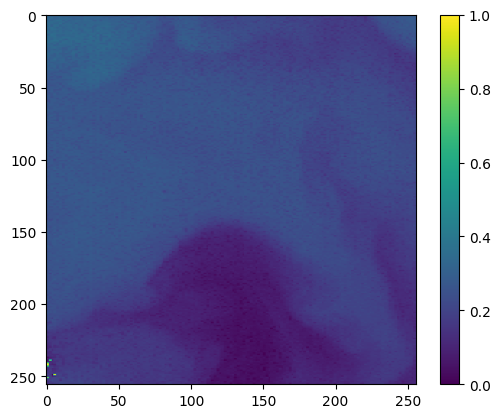

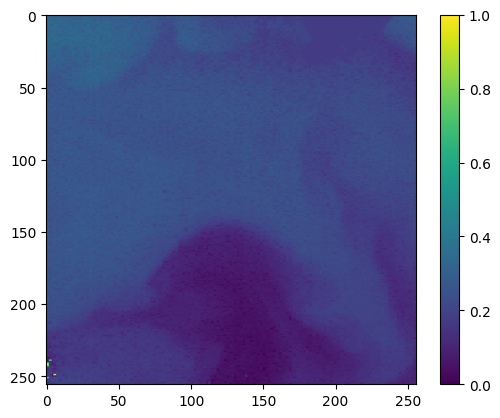

In [ ]:
refined_norm = normalize_with_mask(refined,masks)
plt.figure()
plt.imshow(y_norm[5,:,:,0])
plt.colorbar()
plt.figure()
plt.imshow(complete_norm[5,:,:,0])
plt.colorbar()

In [ ]:


def normalize_with_mask(tensor, mask):
    # Masked min and max calculation
    masked_tensor = tf.where(mask == 0, tensor, tf.fill(tf.shape(tensor), tf.float32.max))
    min_val = tf.reduce_min(masked_tensor, axis=(1, 2), keepdims=True)

    masked_tensor = tf.where(mask == 0, tensor, tf.fill(tf.shape(tensor), tf.float32.min))
    max_val = tf.reduce_max(masked_tensor, axis=(1, 2), keepdims=True)

    # Normalize the entire tensor
    normalized = (tensor - min_val) / (max_val - min_val)
    return normalized

# Normalize using the mask
complete_norm = normalize_with_mask(complete, masks)
y_norm = normalize_with_mask(y, masks)

# Calculate SSIM
ssim_value = tf.image.ssim(complete_norm[:, :, :, 0:1], y_norm[:, :, :, 0:1], max_val=1.0)

print(ssim_value)


tf.Tensor(
[0.9375544  0.94274205 0.9662696  0.926083   0.88162905 0.9952378
 0.9521423  0.9806684  0.98340535 0.9513161 ], shape=(10,), dtype=float32)


1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


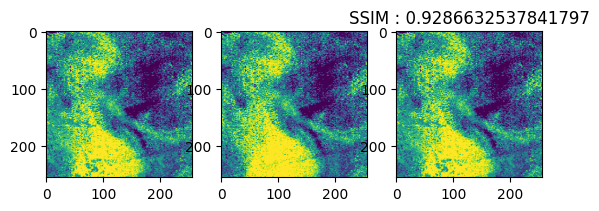

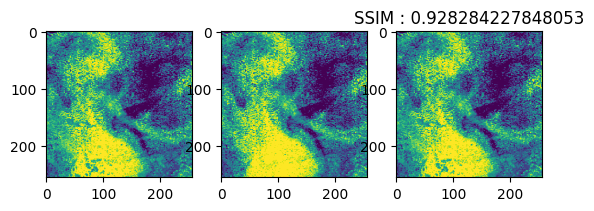

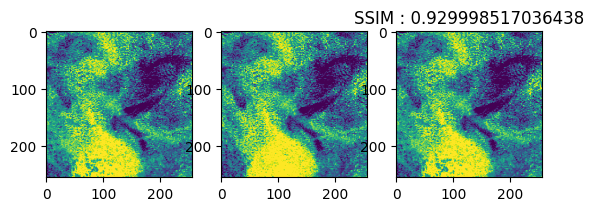

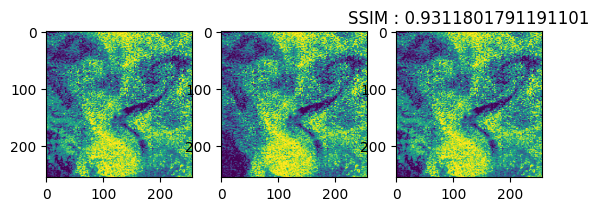

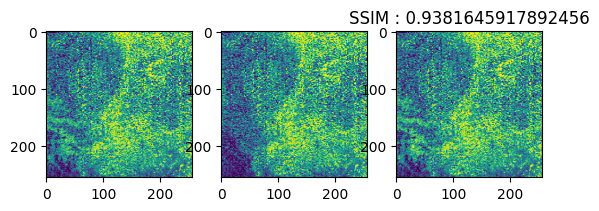

...

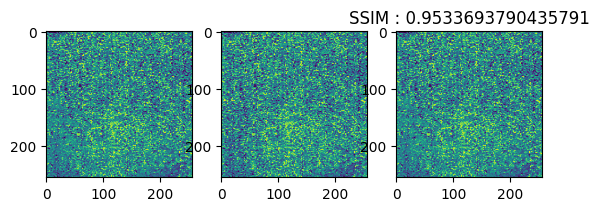

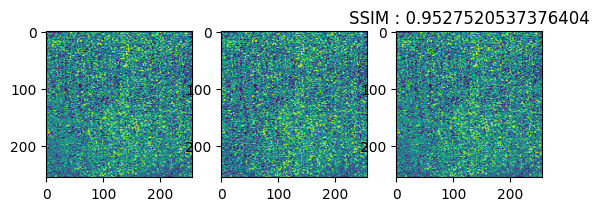

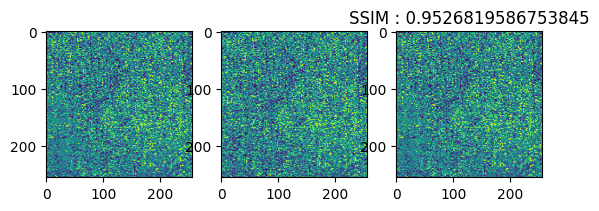

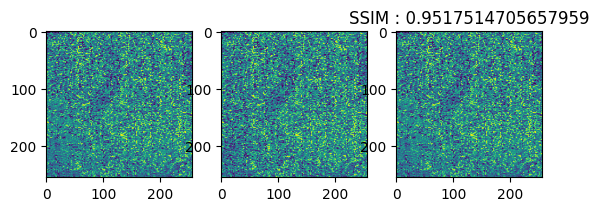

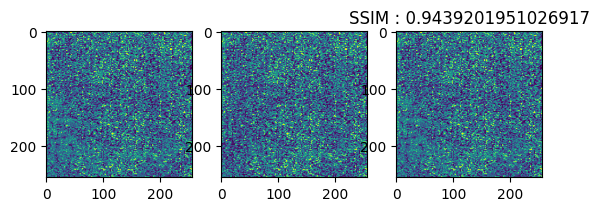

In [ ]:
y = test_ds.take(1)
masks,y = y.as_numpy_iterator().next()


batch = tf.shape(y)[0]
h = tf.shape(y)[1]
w = tf.shape(y)[2]

x = tf.zeros(shape=(batch,h,w,0))
for i in range(11):
  x = tf.concat([x,tf.expand_dims(y[:,:,:,i] * (1 - masks[:,:,:,0]), axis=-1)], axis=-1)

x = np.concatenate((x,masks),axis = -1)
x = x[0:,:,:,:]
coarse, refined = model.predict(x)


def normalize_with_mask(tensor, mask):
    # Masked min and max calculation
    masked_tensor = tf.where(mask == 0, tensor, tf.fill(tf.shape(tensor), tf.float32.max))
    min_val = tf.reduce_min(masked_tensor, axis=(1,2), keepdims=True)

    masked_tensor = tf.where(mask == 0, tensor, tf.fill(tf.shape(tensor), tf.float32.min))
    max_val = tf.reduce_max(masked_tensor, axis=(1,2), keepdims=True)

    # Normalize the entire tensor
    normalized = (tensor - min_val) / (max_val - min_val)
    return tf.clip_by_value(normalized, 0, 1)

#print(tf.shape(x), tf.shape(refined), tf.shape(coarse), tf.shape(y), tf.shape(masks))
complete = tf.expand_dims(x[:,:,:,-1],axis=-1)*refined + (1-tf.expand_dims(x[:,:,:,-1],axis=-1))*y[:,:,:,:]

for i in range(11):
  #x_norm = (x[0,:,:,i:i+1] - np.min(x[0,:,:,i:i+1]))/(np.max(x[0,:,:,i:i+1]) - np.min(x[0,:,:,i:i+1]))
  #complete_norm = (complete[0,:,:,i:i+1] - np.min(x[0,:,:,i:i+1]))/(np.max(x[0,:,:,i:i+1]) - np.min(x[0,:,:,i:i+1]))
  #y_norm = (y[0,:,:,i:i+1] - np.min(y[0,:,:,i:i+1]))/(np.max(y[0,:,:,i:i+1]) - np.min(y[0,:,:,i:i+1]))
  x_norm = normalize_with_mask(x[:,:,:,i:i+1], masks)
  complete_norm = normalize_with_mask(complete[:,:,:,i:i+1], masks)
  y_norm = normalize_with_mask(y[:,:,:,i:i+1], masks)

  ssim_val = tf.image.ssim(complete_norm[0,:,:,0:1], y_norm[0,:,:,0:1], max_val=1)
  plt.figure()
  plt.subplot(1,3,1)
  plt.imshow(x_norm[0,:,:,0])
  #plt.colorbar()
  plt.subplot(1,3,2)
  plt.imshow(y_norm[0,:,:,0])
  #plt.colorbar()
  plt.subplot(1,3,3)
  plt.imshow(complete_norm[0,:,:,0])
  plt.title(f"SSIM : {ssim_val}")
  #plt.colorbar()
  #plt.savefig("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/performance/test4_band_"+str(i)+".png")
  plt.show()



In [ ]:
model.save_weights("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/SAGAN_noisy_fitter_most_epoch.weights.h5")

In [ ]:
#Normalizer
npy_files_cloudless = [f for f in os.listdir(PATH_TO_CLOUD_CLOUDLESS) if f.endswith('.npy')]

for i in range(len(npy_files_cloudless)):
  file = np.load(os.path.join(PATH_TO_CLOUD_CLOUDLESS, npy_files_cloudless[i]))
  norm = (np.log(file) - np.min(np.log(file)))/(np.max(np.log(file)) - np.min(np.log(file)))
  np.save(os.path.join(PATH_TO_CLOUD_CLOUDLESS, npy_files_cloudless[i]), norm)

In [ ]:
np.max(dsnp_c[10:11,:,:,:])
np.max(refined[:,:,:,0])
np.max(coarse[:,:,:,0])
refined2 = (refined[0,:,:,0] - np.min(refined[0,:,:,0]))/(np.max(refined[0,:,:,0]) - np.min(refined[0,:,:,0]))
coarse2 = (coarse[0,:,:,0] - np.min(coarse[0,:,:,0]))/(np.max(coarse[0,:,:,0]) - np.min(coarse[0,:,:,0]))

refined2 = tf.expand_dims(tf.expand_dims(refined2, axis=0),axis=-1)
coarse2 = tf.expand_dims(tf.expand_dims(coarse2, axis=0),axis=-1)

np.max(coarse2[:,:,:,0])
np.max(refined2[:,:,:,0])

In [ ]:
test_dataset = test_ds.take(2)
x,y = test_dataset.as_numpy_iterator().next()
coarse, refined = model.generator.predict(x)
x = x.astype(np.float32)
y = y.astype(np.float32)
coarse = coarse.astype(np.float32)
refined = refined.astype(np.float32)

refined2 = np.zeros_like(refined)
coarse2 = np.zeros_like(coarse)

out = np.zeros_like(refined)

for i in range(11):
  #refined2[:,:,:,i] = (refined[:,:,:,i] - tf.reduce_min(refined[:,:,:,i], axis=0, keepdims=True))/( tf.reduce_max(refined[:,:,:,i], axis=0, keepdims=True) - tf.reduce_min(refined[:,:,:,i], axis=0, keepdims=True))
  #coarse2[:,:,:,i] = (coarse[:,:,:,i] - tf.reduce_min(coarse[:,:,:,i], axis=0, keepdims=True))/( tf.reduce_max(coarse[:,:,:,i], axis=0, keepdims=True) - tf.reduce_min(coarse[:,:,:,i], axis=0, keepdims=True))
  out[:,:,:,i] = x[:,:,:,-1]*refined[:,:,:,i]+ (1-x[:,:,:,-1])*x[:,:,:,i]


for j in range(x.shape[0]):
  for k in range(11):
    x1 = x[j,:,:,k]
    out1 = out[j,:,:,k]
    y1 = y[j,:,:,k]
    ssim_val = tf.image.ssim(tf.expand_dims(out1, axis=-1), tf.expand_dims(y1, axis=-1), max_val=1)
    fig = plt.figure()
    ax = fig.add_subplot(131)
    ax.set_title("Cloudy image")
    ax.imshow(x1)
    ax = fig.add_subplot(132)
    ax.set_title("Inpainted image")
    ax.imshow(out1)
    ax =fig.add_subplot(133)
    ax.set_title("Ground truth")
    ax.imshow(y1)
    fig.suptitle(f"SSIM: {ssim_val}")
    fig.savefig("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/performance/validation_batch_"+str(j)+"_chan_"+str(k)+".png")

ValueError: Exception encountered when calling GatedConv2D.call().

[1mInput 0 of layer "conv2d_79" is incompatible with the layer: expected axis -1 of input shape to have value 12, but received input with shape (10, 256, 256, 1)[0m

Arguments received by GatedConv2D.call():
  • input=tf.Tensor(shape=(10, 256, 256, 1), dtype=float32)

In [ ]:
validation_loss = model.evaluate(test_ds)

In [ ]:
#Load keras file


model.load_weights("./cloud_inpainting/SAGAN_avg_on_recon.keras")


In [ ]:
#Load keras file


model.load_weights("/content/drive/MyDrive/Colab Notebooks/cloud_inpainting/SAGAN_working.keras")



In [ ]:
model.generator.optimizer.learning_rate = 0.00009
model.discriminator.optimizer.learning_rate = 0.00009
model.gam_reg = 50

In [ ]:
print(model.generator.Inputs)

In [ ]:
extractor = keras.Model(inputs=model.generator.input, outputs=model.generator.layers[1].output)
features = extractor.predict(dsnp_c[1:2,:,:,1:3])


fig = plt.figure()
for i, feature in enumerate(features):
    ax = fig.add_subplot(5,4,i+1)
    ax.imshow(feature[0,:,:,0])
fig.savefig('features-2.png')